In [1]:
import pandas as pd
import numpy as np
import random
from PIL import Image

import tensorflow
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

import os
import time
from IPython import display

from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight

import itertools
import shutil
import matplotlib.pyplot as plt
%matplotlib inline


os.listdir('../input')

['images27638',
 'faulty_images.txt',
 'data_records_27638.txt',
 'flavours.csv',
 'metadata27368.csv']

### Create the directory structure
In these folders we will store the images that will later be fed to the Keras generators.

In [2]:
# Create a new directory
base_dir = 'base_dir'
os.mkdir(base_dir)


#[CREATE FOLDERS INSIDE THE BASE DIRECTORY]

# now we create 7 folders inside 'base_dir':

# train_dir
    # Meaty
    # Sweet
    # Piquant
    # Sour
    # Salty
    # Bitter
 
# val_dir
    # Meaty
    # Sweet
    # Piquant
    # Sour
    # Salty
    # Bitter

# create a path to 'base_dir' to which we will join the names of the new folders
# train_dir
train_dir = os.path.join(base_dir, 'train_dir')
os.mkdir(train_dir)

# val_dir
val_dir = os.path.join(base_dir, 'val_dir')
os.mkdir(val_dir)


# [CREATE FOLDERS INSIDE THE TRAIN, VALIDATION AND TEST FOLDERS]
# Inside each folder we create seperate folders for each class

# create new folders inside train_dir
meaty = os.path.join(train_dir, 'Meaty')
os.mkdir(meaty)
sweet = os.path.join(train_dir, 'Sweet')
os.mkdir(sweet)
piq = os.path.join(train_dir, 'Piquant')
os.mkdir(piq)
sour = os.path.join(train_dir, 'Sour')
os.mkdir(sour)
salty = os.path.join(train_dir, 'Salty')
os.mkdir(salty)
bitter = os.path.join(train_dir, 'Bitter')
os.mkdir(bitter)



# create new folders inside val_dir
meaty = os.path.join(val_dir, 'Meaty')
os.mkdir(meaty)
sweet = os.path.join(val_dir, 'Sweet')
os.mkdir(sweet)
piq = os.path.join(val_dir, 'Piquant')
os.mkdir(piq)
sour = os.path.join(val_dir, 'Sour')
os.mkdir(sour)
salty = os.path.join(val_dir, 'Salty')
os.mkdir(salty)
bitter = os.path.join(val_dir, 'Bitter')
os.mkdir(bitter)


### Create Train and Val Sets

In [3]:
# read metadata

df_meta = pd.read_csv('../input/metadata27368.csv')
#df_meta.head()

In [4]:
df_flav = pd.read_csv('../input/flavours.csv')
print(df_flav.columns)
flav = df_flav.values
print(flav)
# rearrange columns in alphabetical order of flavours (to match those used in data augmentation)
your_permutation = [1,5,2,4,3,0]
i = np.argsort(your_permutation)
flav = flav[:,i]
print(flav)
encoded_flav = np.argmax(flav, axis=1)
print(encoded_flav)
df_flav['y'] = encoded_flav

Index(['Meaty', 'Sweet', 'Piquant', 'Sour', 'Salty', 'Bitter'], dtype='object')
[[   nan    nan    nan    nan    nan    nan]
 [0.8333 0.3333 0.5    0.5    0.8333 0.8333]
 [0.5    0.3333 0.     0.8333 0.3333 1.    ]
 ...
 [0.6667 0.6667 0.     0.     1.     0.6667]
 [0.5    0.8333 0.5    0.5    0.6667 1.    ]
 [   nan    nan    nan    nan    nan    nan]]
[[   nan    nan    nan    nan    nan    nan]
 [0.8333 0.8333 0.5    0.8333 0.5    0.3333]
 [1.     0.5    0.     0.3333 0.8333 0.3333]
 ...
 [0.6667 0.6667 0.     1.     0.     0.6667]
 [1.     0.5    0.5    0.6667 0.5    0.8333]
 [   nan    nan    nan    nan    nan    nan]]
[0 0 0 ... 3 0 0]


In [5]:
# import faulty images indexes

file = open("../input/faulty_images.txt", "r")
faul_id = []
for val in file.read().split():
    faul_id.append(int(val)-1)
file.close()
print(len(faul_id),"faulty images")

262 faulty images


In [6]:
# get the unlabeled images indexes

# search for nan values in flavours df
nan_bool = df_flav.isnull().any(axis=1)
nan_id = np.where(nan_bool == True)[0]
print(len(nan_id),'unlabeled images')

4886 unlabeled images


In [7]:
# remove faulty images from unlabeles

f_nan_id = []
for i in faul_id:
    t = np.where(nan_id == i)[0]
    if len(t) != 0:
        f_nan_id.append(t)
nan_id = np.delete(nan_id, f_nan_id)

print(len(nan_id),'true unlabeled images')

4827 true unlabeled images


In [8]:
# Good images !

good_id = np.arange(27638)
good_id = np.delete(good_id, np.union1d(faul_id, nan_id))

print(len(good_id))

22549


0    5714
4    5019
3    3516
1    3507
5    3274
2    1519
Name: y, dtype: int64


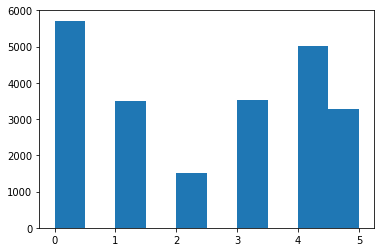

In [9]:
print(df_flav['y'].iloc[good_id].value_counts())

y = df_flav['y'].iloc[good_id]

plt.hist(y)
plt.show()

In [10]:

# Train and validation split 
train_id, val_id, _, _ = train_test_split(good_id, good_id, test_size=0.2, random_state=42, stratify=y)

print('Train', len(train_id))
print('Val',len(val_id))

Train 18039
Val 4510


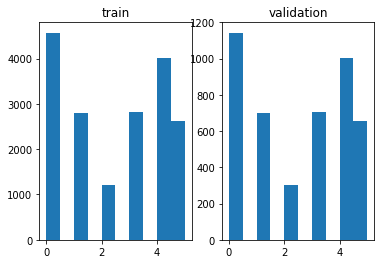

In [11]:
# train and val distibution

plt.subplot(121)
plt.hist(df_flav['y'].iloc[train_id])
plt.title('train')
plt.subplot(122)
plt.hist(df_flav['y'].iloc[val_id])
plt.title('validation')
plt.show()

### Transfer the Images into the Folders

### Bitter --> 0, Meaty --> 1, Piquant --> 2, Salty --> 3, Sour --> 4, Sweet --> 5

In [12]:
def y2label(y):
    if y == 0:
        label = 'Bitter'
    elif y == 1:
        label = 'Meaty'
    elif y == 2:
        label = 'Piquant'
    elif y == 3:
        label = 'Salty'
    elif y == 4:
        label = 'Sour'
    else:
        label = 'Sweet'
    return label

def label2y(label):
    if label == 'Bitter':
        y = 0
    elif label == 'Meaty':
        y = 1
    elif label == 'Piquant':
        y = 2
    elif label == 'Salty':
        y = 3
    elif label == 'Sour':
        y = 4
    else:
        y = 5
    return y


In [13]:
# image folder
img_folder = "../input/images27638/images27638/"

# images indexes (name): train_id, val_id


# Transfer the train images
for i in train_id:
    im = str(i+1)
    while len(im) < 5 :
        im = '0' + im
    im ='img' + im + '.jpg'
    fname = im
    
    y_i = df_flav['y'].iloc[i]
    label = y2label(y_i)
    
    # source path to image
    src = os.path.join(img_folder, fname)
    # destination path to image
    dst = os.path.join(train_dir, label, fname)
    # copy the image from the source to the destination
    shutil.copyfile(src, dst)

# Transfer the val images
for i in val_id:
    im = str(i+1)
    while len(im) < 5 :
        im = '0' + im
    im ='img' + im + '.jpg'
    fname = im
    
    y_i = df_flav['y'].iloc[i]
    label = y2label(y_i)
    
    # source path to image
    src = os.path.join(img_folder, fname)
    # destination path to image
    dst = os.path.join(val_dir, label, fname)
    # copy the image from the source to the destination
    shutil.copyfile(src, dst)



In [14]:
# check how many train images we have in each folder

print(len(os.listdir('base_dir/train_dir/Meaty/')))
print(len(os.listdir('base_dir/train_dir/Sweet/')))
print(len(os.listdir('base_dir/train_dir/Piquant/')))
print(len(os.listdir('base_dir/train_dir/Sour/')))
print(len(os.listdir('base_dir/train_dir/Salty/')))
print(len(os.listdir('base_dir/train_dir/Bitter/')))

2806
2619
1215
4015
2813
4571


In [15]:
# check how many val images we have in each folder

print(len(os.listdir('base_dir/val_dir/Meaty/')))
print(len(os.listdir('base_dir/val_dir/Sweet/')))
print(len(os.listdir('base_dir/val_dir/Piquant/')))
print(len(os.listdir('base_dir/val_dir/Sour/')))
print(len(os.listdir('base_dir/val_dir/Salty/')))
print(len(os.listdir('base_dir/val_dir/Bitter/')))

701
655
304
1004
703
1143


### Copy the train images  into aug_dir

In [16]:
# note that we are not augmenting class 'Bitter'
class_list = ['Meaty','Sweet','Piquant','Salty','Sour']

for item in class_list:
    
    # We are creating temporary directories here because we delete these directories later
    # create a base dir
    aug_dir = 'aug_dir'
    os.mkdir(aug_dir)
    # create a dir within the base dir to store images of the same class
    img_dir = os.path.join(aug_dir, 'img_dir')
    os.mkdir(img_dir)

    # Choose a class
    img_class = item

    # list all images in that directory
    img_list = os.listdir('base_dir/train_dir/' + img_class)

    # Copy images from the class train dir to the img_dir e.g. class 'mel'
    for fname in img_list:
            # source path to image
            src = os.path.join('base_dir/train_dir/' + img_class, fname)
            # destination path to image
            dst = os.path.join(img_dir, fname)
            # copy the image from the source to the destination
            shutil.copyfile(src, dst)


    # point to a dir containing the images and not to the images themselves
    path = aug_dir
    save_path = 'base_dir/train_dir/' + img_class

    # Create a data generator
    datagen = ImageDataGenerator(
        rotation_range=90,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        vertical_flip=True,
        brightness_range=(0.9,1.1),
        fill_mode='nearest')

    batch_size = 50

    aug_datagen = datagen.flow_from_directory(path,
                                           save_to_dir=save_path,
                                           save_format='jpg',
                                                    target_size=(224,224),
                                                    batch_size=batch_size)



    # Generate the augmented images and add them to the training folders
    
    ###########
    
    num_aug_images_wanted = 4600 # total number of images we want to have in each class
    
    ###########
    
    num_files = len(os.listdir(img_dir))
    num_batches = int(np.ceil((num_aug_images_wanted-num_files)/batch_size))

    # run the generator and create about 6000 augmented images
    for i in range(0,num_batches):

        imgs, labels = next(aug_datagen)
        
    # delete temporary directory with the raw image files
    shutil.rmtree('aug_dir')

Found 2806 images belonging to 1 classes.
Found 2619 images belonging to 1 classes.
Found 1215 images belonging to 1 classes.
Found 2813 images belonging to 1 classes.
Found 4015 images belonging to 1 classes.


In [17]:
# Check how many train images we now have in each folder.
# This is the original images plus the augmented images.

print(len(os.listdir('base_dir/train_dir/Meaty/')))
print(len(os.listdir('base_dir/train_dir/Sweet/')))
print(len(os.listdir('base_dir/train_dir/Piquant/')))
print(len(os.listdir('base_dir/train_dir/Sour/')))
print(len(os.listdir('base_dir/train_dir/Salty/')))
print(len(os.listdir('base_dir/train_dir/Bitter/')))

4606
4619
4545
4615
4613
4571


### Set Up the Generators

In [18]:
train_path = 'base_dir/train_dir'
valid_path = 'base_dir/val_dir'

num_train_samples = len(train_id)
num_val_samples = len(val_id)
train_batch_size = 10
val_batch_size = 10
image_size = 224

train_steps = np.ceil(num_train_samples / train_batch_size)
val_steps = np.ceil(num_val_samples / val_batch_size)


In [19]:

datagen = ImageDataGenerator(
    preprocessing_function= \
    tensorflow.keras.applications.mobilenet.preprocess_input)

train_batches = datagen.flow_from_directory(train_path,
                                            target_size=(image_size,image_size),
                                            batch_size=train_batch_size)

valid_batches = datagen.flow_from_directory(valid_path,
                                            target_size=(image_size,image_size),
                                            batch_size=val_batch_size)

# Note: shuffle=False causes the test dataset to not be shuffled
test_batches = datagen.flow_from_directory(valid_path,
                                            target_size=(image_size,image_size),
                                            batch_size=1,
                                            shuffle=False)

Found 27569 images belonging to 6 classes.
Found 4510 images belonging to 6 classes.
Found 4510 images belonging to 6 classes.


### Modify MobileNet Model

In [20]:
# create a copy of a mobilenet model

mobile = tensorflow.keras.applications.mobilenet.MobileNet()

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
17227776/17225924 [==============================] - 1s 0us/step


In [21]:
# CREATE THE MODEL ARCHITECTURE

# Exclude the last 5 layers of the above model.
# This will include all layers up to and including global_average_pooling2d_1
x = mobile.layers[-6].output

# Create a new dense layer for predictions
# 7 corresponds to the number of classes
x = Dropout(0.25)(x)
predictions = Dense(6, activation='softmax')(x)

# inputs=mobile.input selects the input layer, outputs=predictions refers to the
# dense layer we created above.

model = Model(inputs=mobile.input, outputs=predictions)

In [22]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, 225, 225, 3)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
__________

In [23]:
# We need to choose how many layers we actually want to be trained.

# Here we are freezing the weights of all layers except the
# last 23 layers in the new model.
# The last 23 layers of the model will be trained.

for layer in model.layers[:-23]:
    layer.trainable = False

### Train the Model

In [24]:
model.compile(Adam(lr=0.01), loss='categorical_crossentropy', 
              metrics=['acc'])


In [25]:

filepath = "../working/model.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, 
                             save_best_only=True, mode='max')

reduce_lr = ReduceLROnPlateau(monitor='val_acc', factor=0.5, patience=2, 
                                   verbose=1, mode='max', min_lr=0.00001)
                              
    
callbacks_list = [checkpoint, reduce_lr]

history = model.fit_generator(train_batches, steps_per_epoch=train_steps, 
                    validation_data=valid_batches,
                    validation_steps=val_steps,
                    epochs=20, verbose=1,
                   callbacks=callbacks_list)


Instructions for updating:
Use tf.cast instead.
Epoch 1/20
451/451 [==============================] - 18s 39ms/step - loss: 2.6684 - acc: 0.2404

Epoch 00001: val_acc improved from -inf to 0.24035, saving model to ../working/model.h5
2757/2757 [==============================] - 229s 83ms/step - loss: 1.7587 - acc: 0.2778 - val_loss: 2.6684 - val_acc: 0.2404
Epoch 2/20
1966/2757 [====================>.........] - ETA: 58s - loss: 1.6560 - acc: 0.3048

In [26]:
# Best model
model.load_weights(filepath)

### Plot the Training Curves

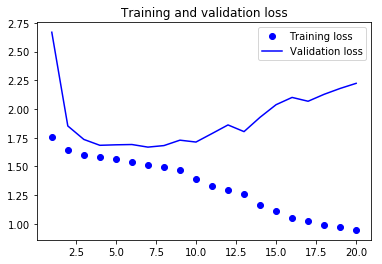

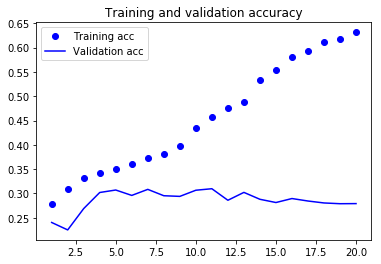

<Figure size 432x288 with 0 Axes>

Best validation accuracy:  0.3097561
On epoch:  11


In [27]:
# display the loss and accuracy curves

import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.figure()

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.show()

print('Best validation accuracy: ', np.max(val_acc))
print('On epoch: ', epochs[np.where(val_acc == np.max(val_acc))[0][0]])

### Create a Confusion Matrix

In [28]:
from sklearn.metrics import confusion_matrix

# Get the labels of the test images.

test_labels = test_batches.classes

In [29]:
# We need these to plot the confusion matrix.
test_labels

array([0, 0, 0, ..., 5, 5, 5], dtype=int32)

In [30]:
# Print the label associated with each class
test_batches.class_indices

{'Bitter': 0, 'Meaty': 1, 'Piquant': 2, 'Salty': 3, 'Sour': 4, 'Sweet': 5}

In [31]:
# make a prediction
predictions = model.predict_generator(test_batches, steps=len(val_id), verbose=1)

4510/4510 [==============================] - 56s 12ms/step


In [32]:
predictions.shape

(4510, 6)

In [33]:
# Source: Scikit Learn website
# http://scikit-learn.org/stable/auto_examples/
# model_selection/plot_confusion_matrix.html#sphx-glr-auto-examples-model-
# selection-plot-confusion-matrix-py


def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

In [34]:
test_labels.shape

(4510,)

In [35]:
# argmax returns the index of the max value in a row
cm = confusion_matrix(test_labels, predictions.argmax(axis=1))

In [36]:
test_batches.class_indices

{'Bitter': 0, 'Meaty': 1, 'Piquant': 2, 'Salty': 3, 'Sour': 4, 'Sweet': 5}

Confusion matrix, without normalization
[[274 156 113  97 277 226]
 [106 192  44  77 151 131]
 [ 63  35  75  20  89  22]
 [143 111  71  76 162 140]
 [161 111  95  64 441 132]
 [ 94  49  26  38 109 339]]


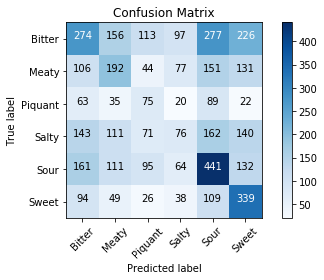

In [37]:
# Define the labels of the class indices. These need to match the 
# order shown above.
cm_plot_labels = ['Bitter', 'Meaty', 'Piquant', 'Salty', 'Sour','Sweet']

plot_confusion_matrix(cm, cm_plot_labels, title='Confusion Matrix')

In [38]:
# delete temporary directory with the raw image files
shutil.rmtree('base_dir')

### Test on images

In [39]:
# SAVE ENCODED LAYERS FOR LATER VISUALIZATIONS
# Input the model and a layer to encode, which can be visualized later
def encoder(model,layer):
    selection = 'conv_pw_' + str(layer)
    encoder = Model(inputs=model.input,outputs=model.get_layer(selection).output)
    #encoder.summary()
    return(encoder)

In [40]:
def plot_pie_chart(model, img, labels):
    #fig, ax = plt.subplots(figsize=(6, 3), subplot_kw=dict(aspect="equal"))

    recipe = labels

    data = model.predict(img)[0]

    wedges, texts = ax.pie(data, wedgeprops=dict(width=0.5), startangle=-40)

    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
    kw = dict(xycoords='data', textcoords='data', arrowprops=dict(arrowstyle="-"),
              bbox=bbox_props, zorder=0, va="center")

    for i, p in enumerate(wedges):
        ang = (p.theta2 - p.theta1)/2. + p.theta1
        y = np.sin(np.deg2rad(ang))
        x = np.cos(np.deg2rad(ang))
        horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
        connectionstyle = "angle,angleA=0,angleB={}".format(ang)
        kw["arrowprops"].update({"connectionstyle": connectionstyle})
        ax.annotate(recipe[i], xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                     horizontalalignment=horizontalalignment, **kw)

    ax.set_title("What AI sees")

In [41]:
# creat a useful dictionary structures

partition = {}
partition['train'] = train_id
partition['validation'] = val_id
partition['faulty'] = faul_id
partition['no_label'] = nan_id

labels = {}
name = {}
image = {}
for i in range(27638):
    
    labels[str(i)] = df_flav.iloc[[i]].values[0] # every label is a panda df rows
    
    name[str(i)] = df_meta['name'][i]
    
    im = str(i+1)
    while len(im) < 5 :
        im = '0' + im
    im ='img' + im + '.jpg'
    image[str(i)] = im

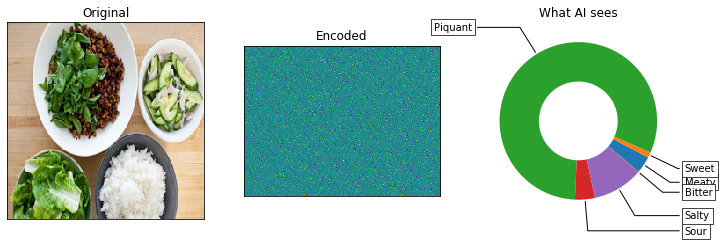

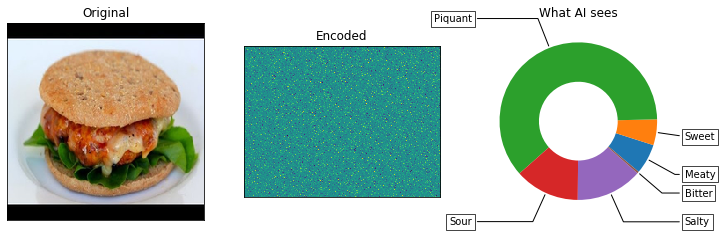

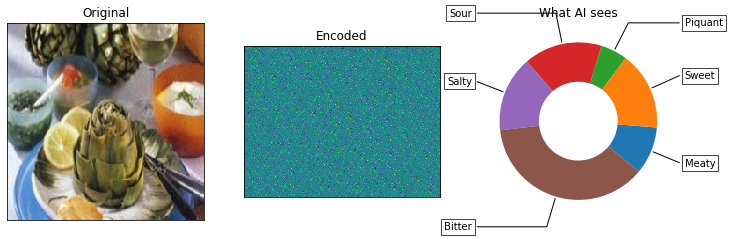

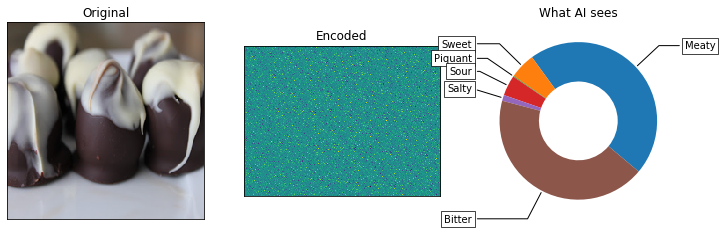

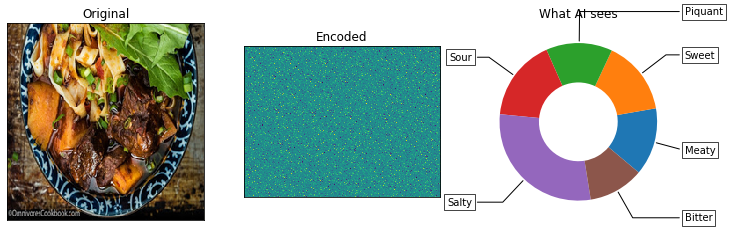

...

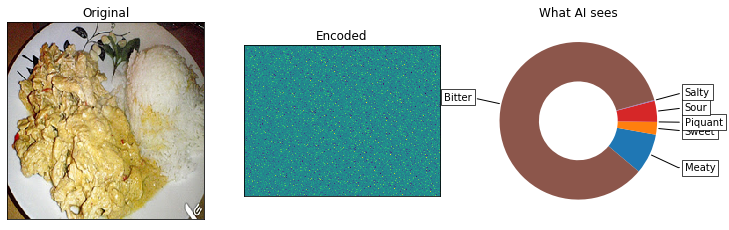

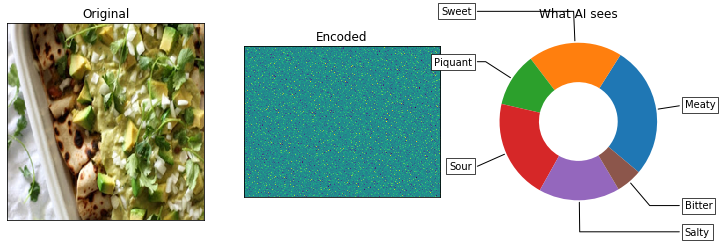

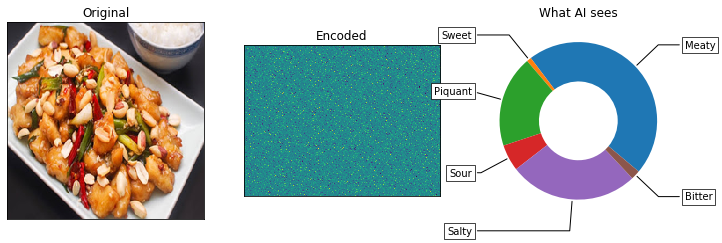

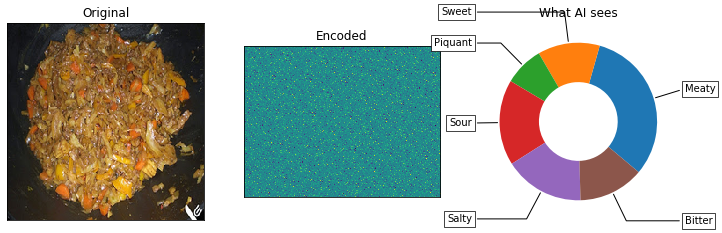

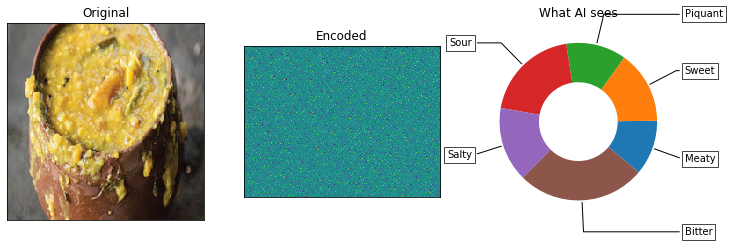

In [42]:
num_images = 50
np.random.seed(42)
random_images = random.sample(list(nan_id),num_images)

encoded = encoder(model, 12)



for i, img_id in enumerate(random_images):
    
    plt.figure(figsize=(12,12))
    #dsaodskaod
    
    #Load in example image
    im = Image.open("../input/images27638/images27638/"+image[str(img_id)])
    im = im.resize((224, 224), Image.ANTIALIAS)
    im.load()
    im = np.asarray(im, dtype=np.uint8)/255

    #Plot original image
    ax = plt.subplot(1, 3, 1)
    plt.imshow(im)
    plt.title('Original')
    im = np.expand_dims(im, axis=0)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    #[LORENZO] HERE WE WANT TO VISUALIZE THE ENCODED LAYERS
    #Plot encoded image ("what the AE sees")
    ax = plt.subplot(1, 3, 2)
    encoded_img = encoded.predict(im)
    #This is still from the autoencoder so we have to reshape differently
    #To plot the image we need to know the dimension of that layer
    #This can be found by multiplication e.g. 
    #conv_pw_12 (Conv2D)  (None, 7, 7, 1024)    = 7*7*1024 = 50,176 dimensions
    #We need to reshape the image to fit this dimension e.g. 256 x 196 = 50,176 
    plt.imshow(encoded_img.reshape(256, 196).T)
    plt.title('Encoded')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    #Plot decoded image ("what the AE reconstructed")
    ax = plt.subplot(1, 3, 3)
    plot_pie_chart(model, im, df_flav.columns)
    plt.show()